In [1]:
# Setup
from pathlib import Path
import sys
import plotly.graph_objects as go
import pandas as pd
import matplotlib.pyplot as plt

PROJECT_ROOT = Path("..").resolve()
sys.path.append(str(PROJECT_ROOT))

from src.trihydra.layer1.basic_checks import run_basic_checks
from src.trihydra.layer1.behaviour_checks import run_behavioural_checks
from src.trihydra.layer1.behaviour_profile import calculate_profile

In [2]:
DATA_DIR = PROJECT_ROOT / "data"

csv_files = sorted(DATA_DIR.glob("GRDC_*_streamflow_data.csv"))

csv_files

[WindowsPath('D:/Workplace/ECMWF Code for Earth Challenge/Coding Phase/TriHydrA/data/GRDC_4123300_streamflow_data.csv'),
 WindowsPath('D:/Workplace/ECMWF Code for Earth Challenge/Coding Phase/TriHydrA/data/GRDC_5304140_streamflow_data.csv'),
 WindowsPath('D:/Workplace/ECMWF Code for Earth Challenge/Coding Phase/TriHydrA/data/GRDC_6341500_streamflow_data.csv')]

In [3]:
def load_basin_csv(file_path):
    df = pd.read_csv(file_path)
    df["Date"] = pd.to_datetime(df["Date"])
    df = df.set_index("Date").sort_index()
    return df

basin_data = {fp.stem.replace("_streamflow_data", ""): load_basin_csv(fp) for fp in csv_files}

list(basin_data.keys())

['GRDC_4123300', 'GRDC_5304140', 'GRDC_6341500']

In [4]:
# Run Checks

all_results = []

for basin_id, df in basin_data.items():
    obs = df["Observed_m3s"]
    sim = df["Simulated_m3s"]

    for result in run_basic_checks(obs):
        result.update({"basin_id": basin_id, "series": "obs", "check_group": "basic"})
        all_results.append(result)

    for result in run_basic_checks(sim):
        result.update({"basin_id": basin_id, "series": "sim", "check_group": "basic"})
        all_results.append(result)

    for result in run_behavioural_checks(obs, series_type="obs"):
        result.update({"basin_id": basin_id, "series": "obs"})
        all_results.append(result)

    for result in run_behavioural_checks(sim, series_type="sim"):
        result.update({"basin_id": basin_id, "series": "sim"})
        all_results.append(result)

results_df = pd.DataFrame(all_results)

results_df[["basin_id", "series", "check_group", "check", "status", "flag", "value", "message"]]

,basin_id,series,check_group,check,status,flag,value,message
0,GRDC_4123300,obs,basic,missing_values,NaN,True,2.0,Internal missing day count = 2.
1,GRDC_4123300,obs,basic,long_gaps,NaN,False,1.0,Longest internal missing gap = 1 day(s).
2,GRDC_4123300,obs,basic,negative_discharge,NaN,False,0.0,Negative discharge count = 0.
3,GRDC_4123300,obs,basic,duplicate_timestamps,NaN,False,0.0,Duplicate timestamp count = 0.
4,GRDC_4123300,obs,basic,timestep_consistency,NaN,False,0.0,Irregular daily timestep count = 0.
5,GRDC_4123300,sim,basic,missing_values,NaN,False,0.0,Internal missing day count = 0.
6,GRDC_4123300,sim,basic,long_gaps,NaN,False,0.0,Longest internal missing gap = 0 day(s).
7,GRDC_4123300,sim,basic,negative_discharge,NaN,False,0.0,Negative discharge count = 0.
8,GRDC_4123300,sim,basic,duplicate_timestamps,NaN,False,0.0,Duplicate timestamp count = 0.
9,GRDC_4123300,sim,basic,timestep_consistency,NaN,False,0.0,Irregular daily timestep count = 0.


In [5]:
summary = (
    results_df
    .groupby(["basin_id", "series", "check_group", "check"], as_index=False)
    .agg(
        flag=("flag", "max"),
        value=("value", "first"),
        status=("status", "first"),
        message=("message", "first"),
    )
)

summary

,basin_id,series,check_group,check,flag,value,status,message
0,GRDC_4123300,obs,basic,duplicate_timestamps,False,0.0,NaN,Duplicate timestamp count = 0.
1,GRDC_4123300,obs,basic,long_gaps,False,1.0,NaN,Longest internal missing gap = 1 day(s).
2,GRDC_4123300,obs,basic,missing_values,True,2.0,NaN,Internal missing day count = 2.
3,GRDC_4123300,obs,basic,negative_discharge,False,0.0,NaN,Negative discharge count = 0.
4,GRDC_4123300,obs,basic,timestep_consistency,False,0.0,NaN,Irregular daily timestep count = 0.
5,GRDC_4123300,obs,behavioural,gradual_drift,False,0.0,completed,No gradual drift candidate detected.
6,GRDC_4123300,obs,behavioural,low_variability,True,21.0,completed,Low variability uses 21-day rolling CV and rol...
7,GRDC_4123300,obs,behavioural,spike_dip,False,0.0,completed,Spike/dip candidates = 0; local deviation thre...
8,GRDC_4123300,obs,behavioural,step_shift,True,3.0,completed,Step-shift candidates = 3; method = 14-day bef...
9,GRDC_4123300,obs,behavioural,zero_flow_regime,False,0.0,descriptor,Zero-flow ratio = 0.000; zero-flow count = 0; ...


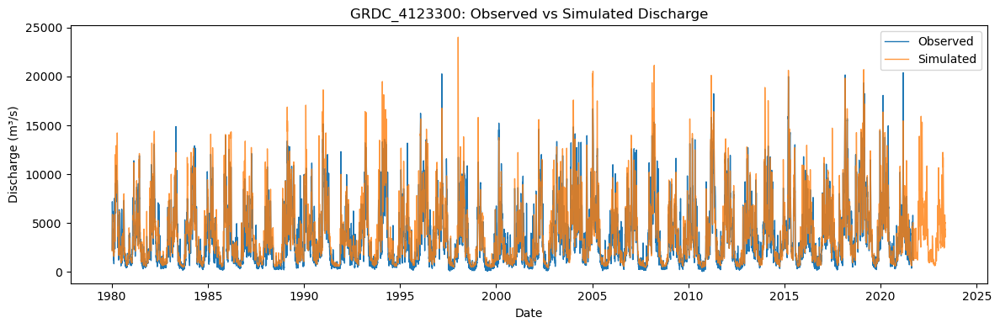

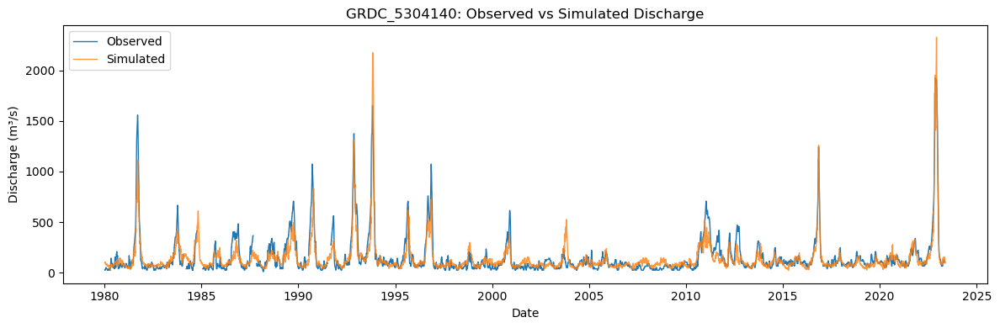

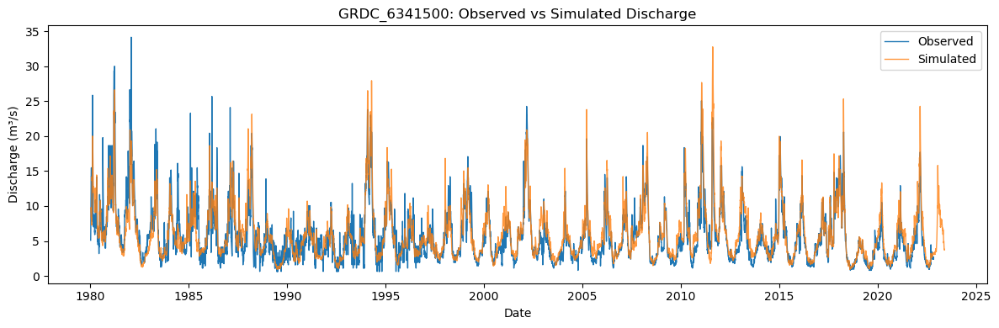

In [6]:
for basin_id, df in basin_data.items():
    plt.figure(figsize=(12, 4))
    plt.plot(df.index, df["Observed_m3s"], label="Observed", linewidth=1)
    plt.plot(df.index, df["Simulated_m3s"], label="Simulated", linewidth=1, alpha=0.8)
    plt.title(f"{basin_id}: Observed vs Simulated Discharge")
    plt.xlabel("Date")
    plt.ylabel("Discharge (m³/s)")
    plt.legend()
    plt.tight_layout()
    plt.show()

In [7]:
# Flag-points

def get_flag_points(series, results_df):
    flag_rows = results_df[results_df["flag"] == True].copy()
    records = []

    for _, row in flag_rows.iterrows():
        check_name = row.get("check", "")
        timestamps = row.get("flagged_timestamps", [])

        if not isinstance(timestamps, list):
            continue

        for timestamp in timestamps:
            ts = pd.to_datetime(timestamp)

            if ts not in series.index:
                continue

            q_value = series.loc[ts]

            if isinstance(q_value, pd.Series):
                q_value = q_value.iloc[0]

            if pd.isna(q_value):
                local_window = series.loc[
                    ts - pd.Timedelta(days=7): ts + pd.Timedelta(days=7)
                ]
                q_value = local_window.median(skipna=True)

            records.append({
                "timestamp": ts,
                "q": q_value,
                "check": check_name,
                "message": row.get("message", ""),
                "status": row.get("status", ""),
                "value": row.get("value", ""),
            })

    return pd.DataFrame(records)

def plot_layer1_flags(series, results_df, title):
    flag_points = get_flag_points(series, results_df)

    fig = go.Figure()

    fig.add_trace(
        go.Scatter(
            x=series.index,
            y=series.values,
            mode="lines",
            name="Discharge",
            line=dict(width=1),
            hovertemplate="Date: %{x}<br>Q: %{y:.4f}<extra></extra>",
        )
    )

    if not flag_points.empty:
        for check_name in flag_points["check"].unique():
            subset = flag_points[flag_points["check"] == check_name]

            fig.add_trace(
                go.Scatter(
                    x=subset["timestamp"],
                    y=subset["q"],
                    mode="markers",
                    name=check_name,
                    marker=dict(size=8),
                    customdata=subset[["message", "status", "value"]],
                    hovertemplate=(
                        "Date: %{x}<br>"
                        "Q: %{y:.4f}<br>"
                        "Message: %{customdata[0]}<br>"
                        "Status: %{customdata[1]}<br>"
                        "Value: %{customdata[2]}"
                        "<extra></extra>"
                    ),
                )
            )

    fig.update_layout(
        title=title,
        xaxis_title="Date",
        yaxis_title="Discharge (m³/s)",
        hovermode="closest",
        height=600,
        xaxis=dict(
            rangeslider=dict(visible=True),
            type="date",
        ),
        legend_title="Layer 1 flags",
    )

    fig.show()

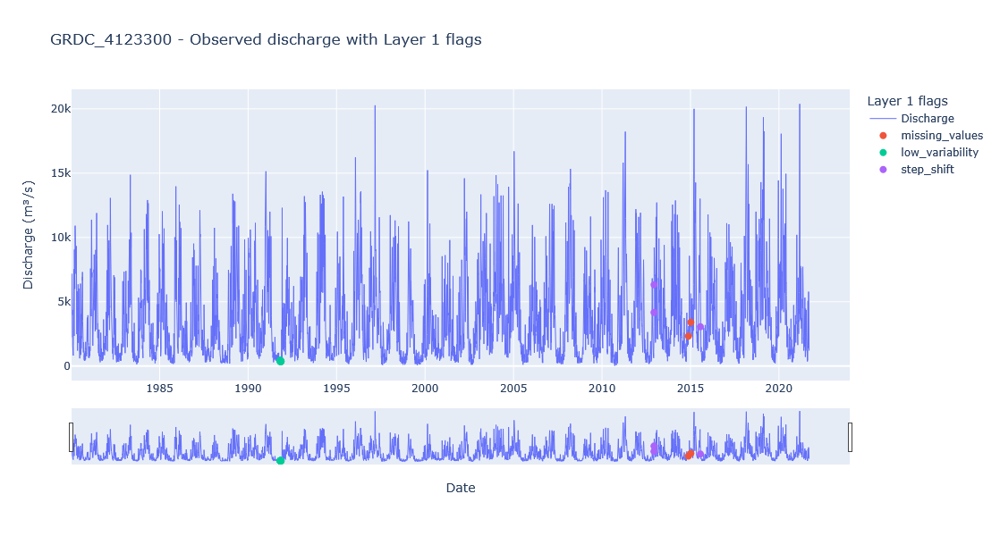

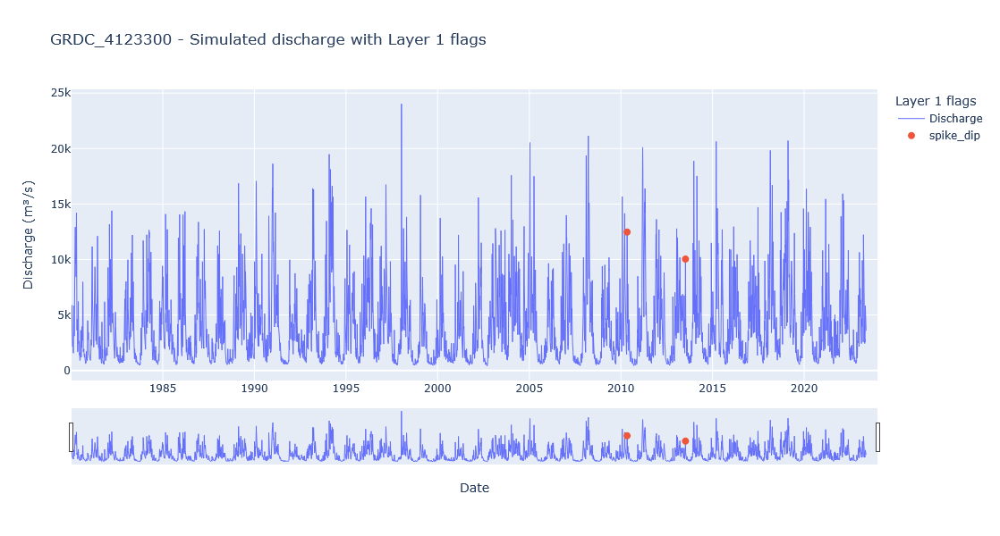

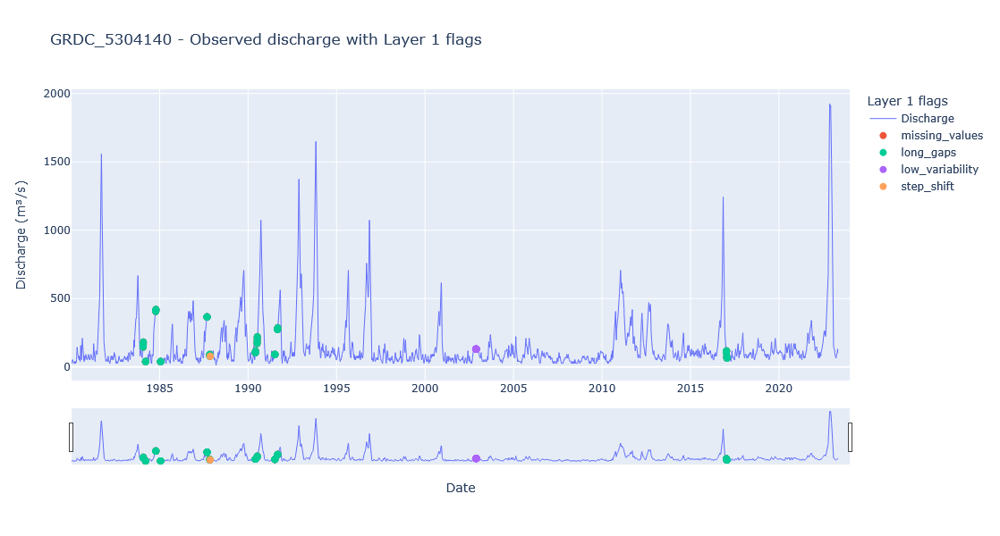

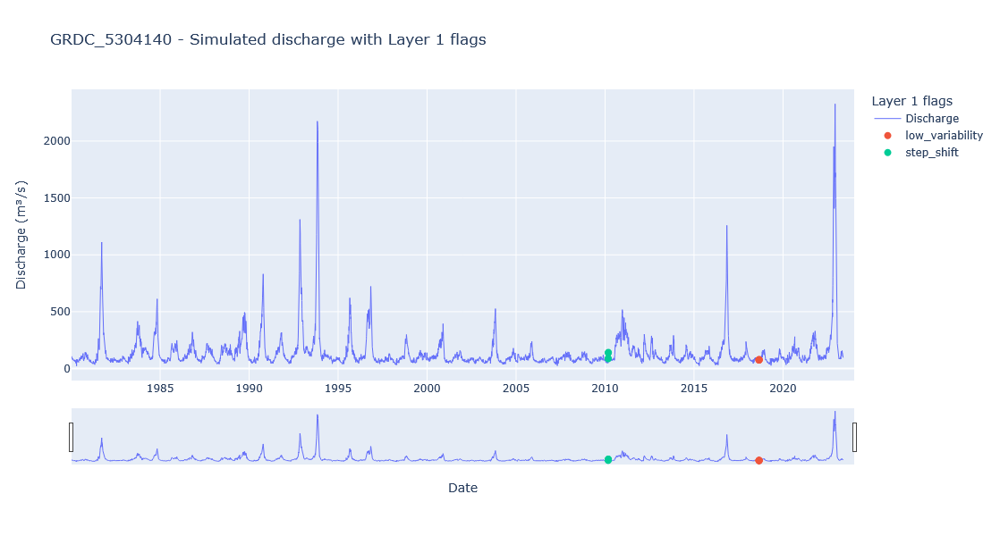

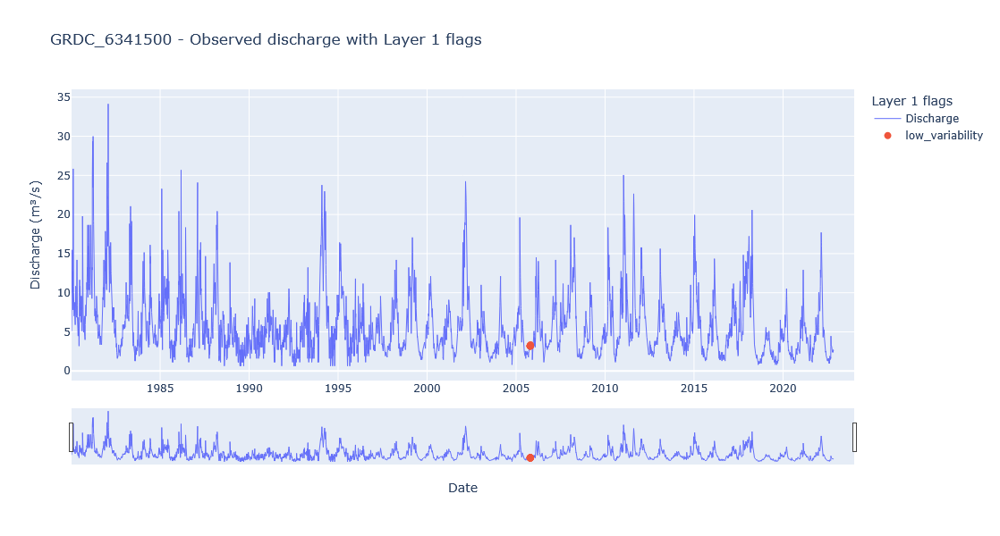

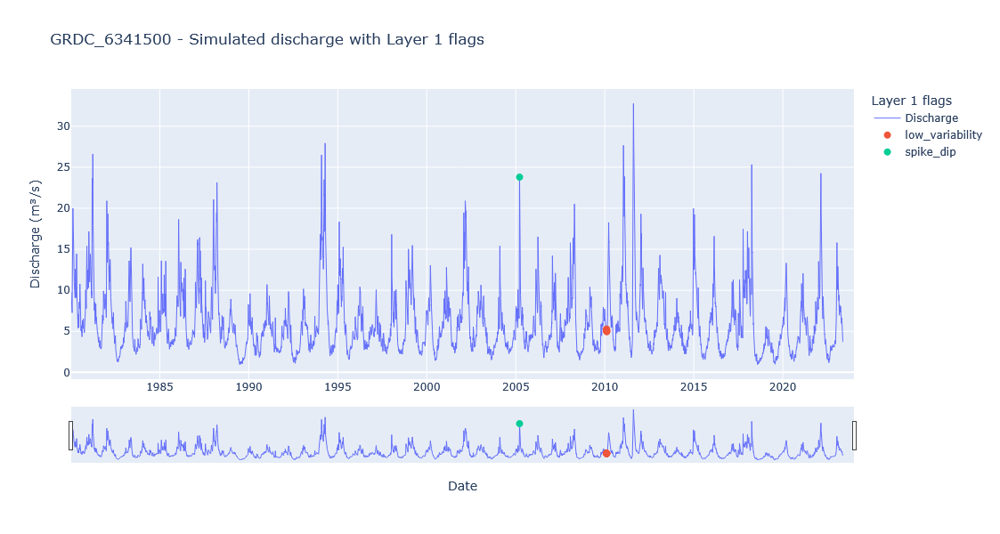

In [8]:
for basin_id, df in basin_data.items():
    obs_results = results_df[
        (results_df["basin_id"] == basin_id)
        & (results_df["series"] == "obs")
    ]

    sim_results = results_df[
        (results_df["basin_id"] == basin_id)
        & (results_df["series"] == "sim")
    ]

    plot_layer1_flags(
        df["Observed_m3s"],
        obs_results,
        title=f"{basin_id} - Observed discharge with Layer 1 flags",
    )

    plot_layer1_flags(
        df["Simulated_m3s"],
        sim_results,
        title=f"{basin_id} - Simulated discharge with Layer 1 flags",
    )

In [9]:
summary_cols = [
    "basin_id",
    "series",
    "check_group",
    "check",
    "status",
    "flag",
    "value",
    "message",
]

summary_table = results_df[summary_cols].copy()

summary_table

,basin_id,series,check_group,check,status,flag,value,message
0,GRDC_4123300,obs,basic,missing_values,NaN,True,2.0,Internal missing day count = 2.
1,GRDC_4123300,obs,basic,long_gaps,NaN,False,1.0,Longest internal missing gap = 1 day(s).
2,GRDC_4123300,obs,basic,negative_discharge,NaN,False,0.0,Negative discharge count = 0.
3,GRDC_4123300,obs,basic,duplicate_timestamps,NaN,False,0.0,Duplicate timestamp count = 0.
4,GRDC_4123300,obs,basic,timestep_consistency,NaN,False,0.0,Irregular daily timestep count = 0.
5,GRDC_4123300,sim,basic,missing_values,NaN,False,0.0,Internal missing day count = 0.
6,GRDC_4123300,sim,basic,long_gaps,NaN,False,0.0,Longest internal missing gap = 0 day(s).
7,GRDC_4123300,sim,basic,negative_discharge,NaN,False,0.0,Negative discharge count = 0.
8,GRDC_4123300,sim,basic,duplicate_timestamps,NaN,False,0.0,Duplicate timestamp count = 0.
9,GRDC_4123300,sim,basic,timestep_consistency,NaN,False,0.0,Irregular daily timestep count = 0.


In [10]:
flag_summary = (
    results_df
    .groupby(["basin_id", "series", "check_group", "check", "status"], as_index=False)
    .agg(
        flag=("flag", "max"),
        value=("value", "first"),
        flagged_count=("flagged_timestamps", lambda x: sum(len(v) if isinstance(v, list) else 0 for v in x)),
        message=("message", "first"),
    )
)

flag_summary

,basin_id,series,check_group,check,status,flag,value,flagged_count,message
0,GRDC_4123300,obs,behavioural,gradual_drift,completed,False,0.0,0,No gradual drift candidate detected.
1,GRDC_4123300,obs,behavioural,low_variability,completed,True,21.0,21,Low variability uses 21-day rolling CV and rol...
2,GRDC_4123300,obs,behavioural,spike_dip,completed,False,0.0,0,Spike/dip candidates = 0; local deviation thre...
3,GRDC_4123300,obs,behavioural,step_shift,completed,True,3.0,3,Step-shift candidates = 3; method = 14-day bef...
4,GRDC_4123300,obs,behavioural,zero_flow_regime,descriptor,False,0.0,0,Zero-flow ratio = 0.000; zero-flow count = 0; ...
5,GRDC_4123300,sim,behavioural,gradual_drift,completed,False,0.0,0,No gradual drift candidate detected.
6,GRDC_4123300,sim,behavioural,low_variability,completed,False,0.0,0,Low variability uses 21-day rolling CV and rol...
7,GRDC_4123300,sim,behavioural,spike_dip,completed,True,2.0,2,Spike/dip candidates = 2; local deviation thre...
8,GRDC_4123300,sim,behavioural,step_shift,completed,False,0.0,0,Step-shift candidates = 0; method = 14-day bef...
9,GRDC_4123300,sim,behavioural,zero_flow_regime,descriptor,False,0.0,0,Zero-flow ratio = 0.000; zero-flow count = 0; ...


In [11]:
OUTPUT_DIR = PROJECT_ROOT / "outputs" / "layer1_demo"
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

results_df.to_csv(OUTPUT_DIR / "layer1_check_results_full.csv", index=False)
flag_summary.to_csv(OUTPUT_DIR / "layer1_flag_summary.csv", index=False)

print(f"Saved tables to: {OUTPUT_DIR}")

Saved tables to: D:\Workplace\ECMWF Code for Earth Challenge\Coding Phase\TriHydrA\outputs\layer1_demo
